Code for **"Blind restoration of a JPEG-compressed image"** and **"Blind image denoising"** figures. Select `fname` below to switch between the two.

- To see overfitting set `num_iter` to a large value.

In [1]:
"""
*Uncomment if running on colab*
Set Runtime -> Change runtime type -> Under Hardware Accelerator select GPU in Google Colab
"""
!git clone https://github.com/DmitryUlyanov/deep-image-prior
!mv deep-image-prior/* ./

Cloning into 'deep-image-prior'...
remote: Enumerating objects: 289, done.
remote: Total 289 (delta 0), reused 0 (delta 0), pack-reused 289
Receiving objects: 100% (289/289), 24.28 MiB | 17.44 MiB/s, done.
Resolving deltas: 100% (155/155), done.


# Import libs

In [5]:
from __future__ import print_function
import matplotlib.pyplot as plt
%matplotlib inline

import os
#os.environ['CUDA_VISIBLE_DEVICES'] = '3'

import numpy as np
from models import *

import torch
import torch.optim

from skimage.metrics import peak_signal_noise_ratio
from utils.denoising_utils import *

torch.backends.cudnn.enabled = True
torch.backends.cudnn.benchmark =True
dtype = torch.cuda.FloatTensor

imsize =-1
PLOT = True
sigma = 25
sigma_ = sigma/255.

In [3]:
# deJPEG
fname = 'data/denoising/peppers_gray.jpg'

## denoising
#fname = 'data/denoising/F16_GT.png'

# Load image

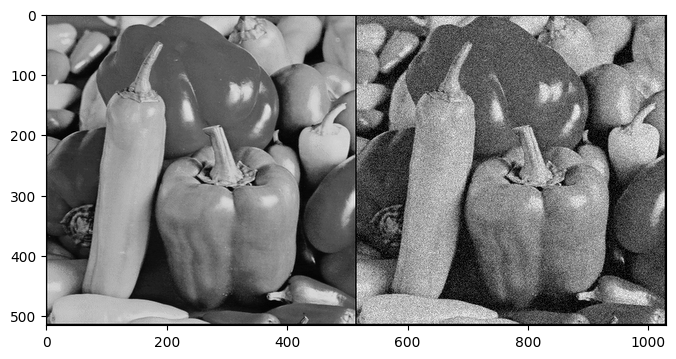

In [6]:
if fname == 'data/denoising/snail.jpg':
    img_noisy_pil = crop_image(get_image(fname, imsize)[0], d=32)
    img_noisy_np = pil_to_np(img_noisy_pil)

    # As we don't have ground truth
    img_pil = img_noisy_pil
    img_np = img_noisy_np

    if PLOT:
        plot_image_grid([img_np], 4, 5);

elif fname == 'data/denoising/F16_GT.png' or True:
    # Add synthetic noise
    img_pil = crop_image(get_image(fname, imsize)[0], d=32)
    img_np = pil_to_np(img_pil)

    img_noisy_pil, img_noisy_np = get_noisy_image(img_np, sigma_)

    if PLOT:
        plot_image_grid([img_np, img_noisy_np], 4, 6);
else:
    assert False

# Setup

In [10]:
INPUT = 'noise' # 'meshgrid'
pad = 'reflection'
OPT_OVER = 'net' # 'net,input'

reg_noise_std = 1./30. # set to 1./20. for sigma=50
LR = 0.01

OPTIMIZER='adam' # 'LBFGS'
show_every = 100
exp_weight=0.99

if fname == 'data/denoising/snail.jpg' or True:
    num_iter = 2400
    input_depth = 1
    figsize = 5

    net = skip(
                input_depth, 1,
                num_channels_down = [8, 16, 32, 64, 128],
                num_channels_up   = [8, 16, 32, 64, 128],
                num_channels_skip = [0, 0, 0, 4, 4],
                upsample_mode='bilinear',
                need_sigmoid=True, need_bias=True, pad=pad, act_fun='LeakyReLU')

    net = net.type(dtype)

elif fname == 'data/denoising/F16_GT.png':
    num_iter = 3000
    input_depth = 32
    figsize = 4


    net = get_net(input_depth, 'skip', pad,
                  skip_n33d=128,
                  skip_n33u=128,
                  skip_n11=4,
                  num_scales=5,
                  upsample_mode='bilinear').type(dtype)

else:
    assert False

net_input = get_noise(input_depth, INPUT, (img_pil.size[1], img_pil.size[0])).type(dtype).detach()

# Compute number of parameters
s  = sum([np.prod(list(p.size())) for p in net.parameters()]);
print ('Number of params: %d' % s)

# Loss
mse = torch.nn.MSELoss().type(dtype)

img_noisy_torch = np_to_torch(img_noisy_np).type(dtype)

Number of params: 572665


In [11]:
from torchsummary import summary
summary(net, (1, 512, 512))

----------------------------------------------------------------
        Layer (type)               Output Shape         Param #
   ReflectionPad2d-1          [-1, 1, 514, 514]               0
            Conv2d-2          [-1, 8, 256, 256]              80
       BatchNorm2d-3          [-1, 8, 256, 256]              16
         LeakyReLU-4          [-1, 8, 256, 256]               0
   ReflectionPad2d-5          [-1, 8, 258, 258]               0
            Conv2d-6          [-1, 8, 256, 256]             584
       BatchNorm2d-7          [-1, 8, 256, 256]              16
         LeakyReLU-8          [-1, 8, 256, 256]               0
   ReflectionPad2d-9          [-1, 8, 258, 258]               0
           Conv2d-10         [-1, 16, 128, 128]           1,168
      BatchNorm2d-11         [-1, 16, 128, 128]              32
        LeakyReLU-12         [-1, 16, 128, 128]               0
  ReflectionPad2d-13         [-1, 16, 130, 130]               0
           Conv2d-14         [-1, 16, 1

In [9]:
net_input.shape

torch.Size([1, 3, 512, 512])

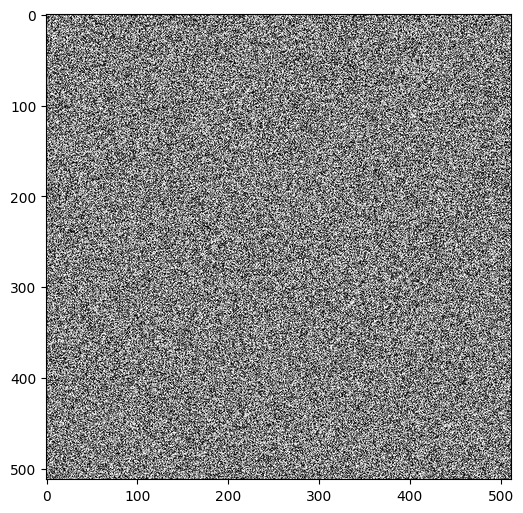

array([[[0.03929309, 0.0323017 , 0.05310918, ..., 0.08683074,
         0.02227074, 0.00733763],
        [0.09844651, 0.07016097, 0.08240137, ..., 0.09500767,
         0.01625114, 0.04000013],
        [0.01468421, 0.04378761, 0.01401243, ..., 0.04291768,
         0.05319974, 0.04022149],
        ...,
        [0.09838625, 0.08700421, 0.01252375, ..., 0.00203519,
         0.00821195, 0.0409779 ],
        [0.03629317, 0.0073894 , 0.01695248, ..., 0.08471048,
         0.03195737, 0.06985525],
        [0.06134984, 0.06995308, 0.08386513, ..., 0.02322113,
         0.08867203, 0.05688167]],

       [[0.03929309, 0.0323017 , 0.05310918, ..., 0.08683074,
         0.02227074, 0.00733763],
        [0.09844651, 0.07016097, 0.08240137, ..., 0.09500767,
         0.01625114, 0.04000013],
        [0.01468421, 0.04378761, 0.01401243, ..., 0.04291768,
         0.05319974, 0.04022149],
        ...,
        [0.09838625, 0.08700421, 0.01252375, ..., 0.00203519,
         0.00821195, 0.0409779 ],
        [0.0

In [12]:
out_np = torch_to_np(net_input)
plot_image_grid([out_np], factor=figsize, nrow=1)

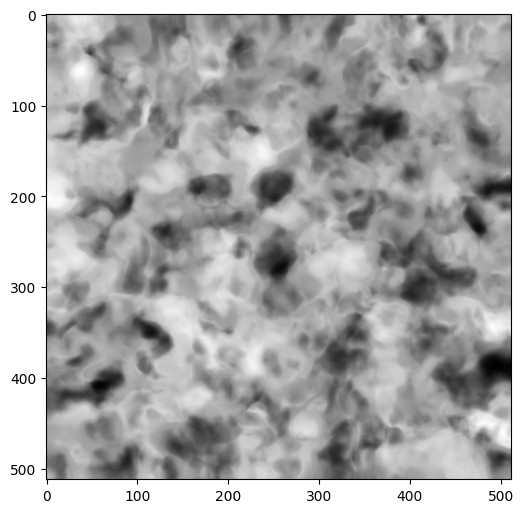

array([[[0.53359795, 0.5409238 , 0.54261225, ..., 0.4772738 ,
         0.47681987, 0.48138615],
        [0.53101933, 0.53847146, 0.54029274, ..., 0.48015285,
         0.47928232, 0.48343563],
        [0.51645064, 0.522999  , 0.52530634, ..., 0.4843996 ,
         0.48330897, 0.4880743 ],
        ...,
        [0.50931084, 0.5106973 , 0.5126493 , ..., 0.437048  ,
         0.4425297 , 0.44624513],
        [0.51093715, 0.512224  , 0.51401114, ..., 0.44121754,
         0.44468316, 0.4483307 ],
        [0.5106387 , 0.51184237, 0.5133306 , ..., 0.44301173,
         0.44600916, 0.44967693]],

       [[0.53359795, 0.5409238 , 0.54261225, ..., 0.4772738 ,
         0.47681987, 0.48138615],
        [0.53101933, 0.53847146, 0.54029274, ..., 0.48015285,
         0.47928232, 0.48343563],
        [0.51645064, 0.522999  , 0.52530634, ..., 0.4843996 ,
         0.48330897, 0.4880743 ],
        ...,
        [0.50931084, 0.5106973 , 0.5126493 , ..., 0.437048  ,
         0.4425297 , 0.44624513],
        [0.5

In [13]:
out = torch_to_np(net(net_input))
plot_image_grid([out], factor=figsize, nrow=1)

# Optimize

Starting optimization with ADAM


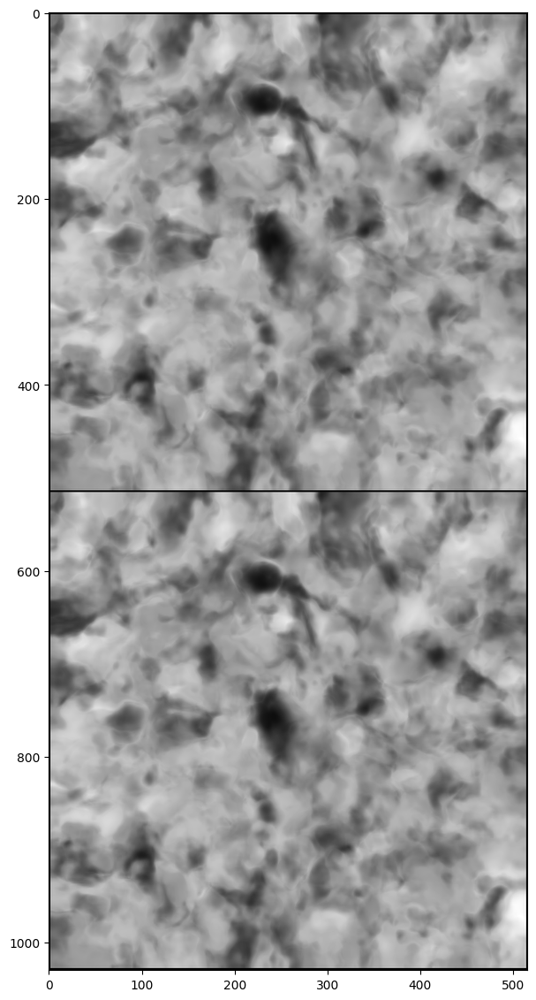

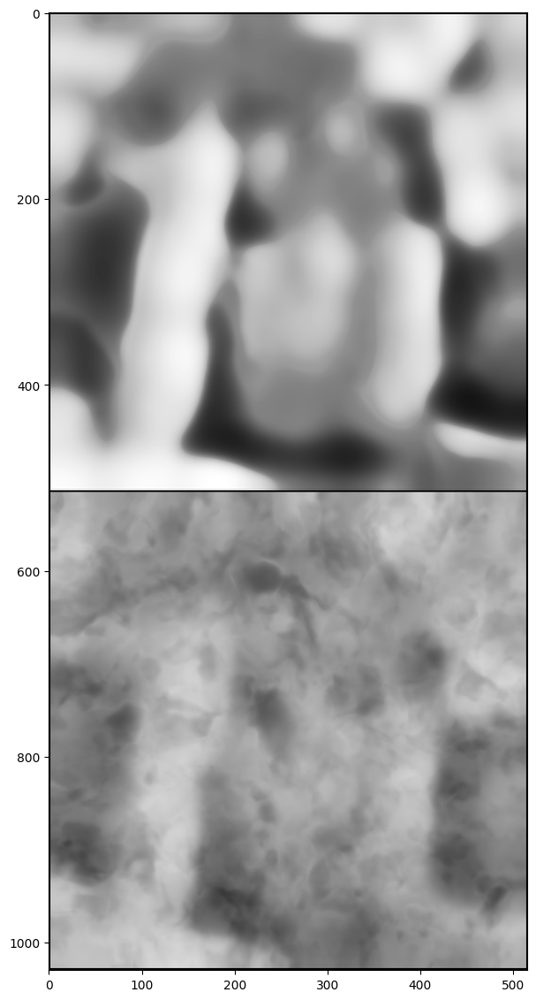

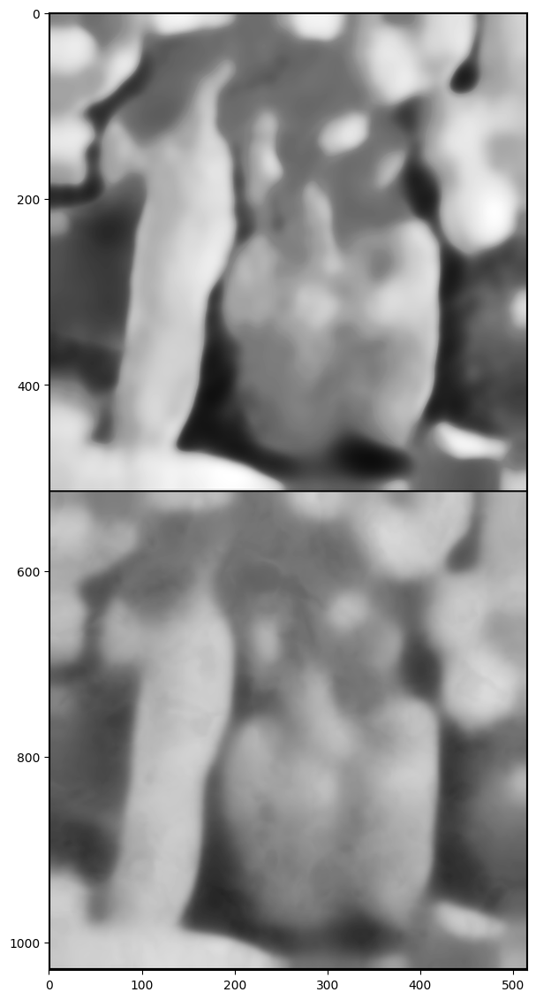

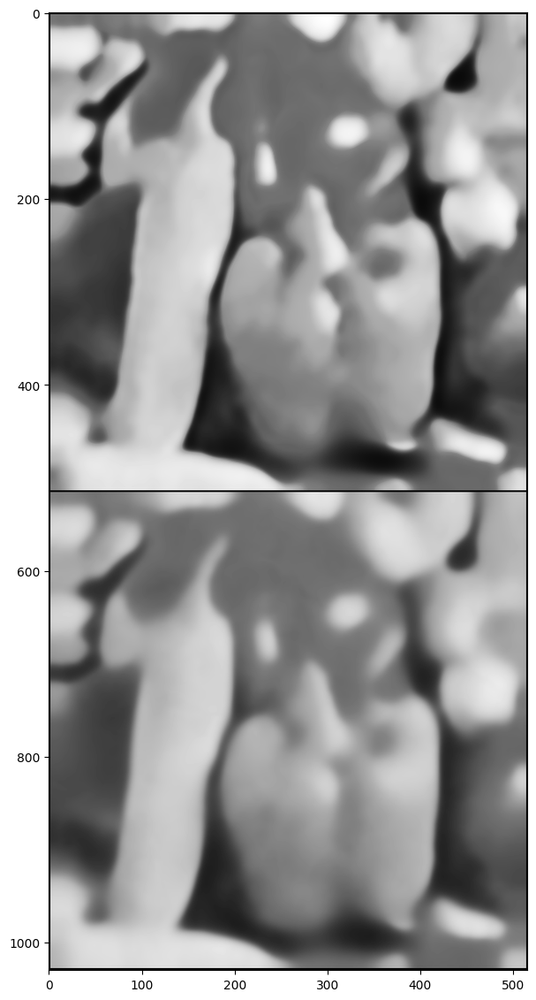

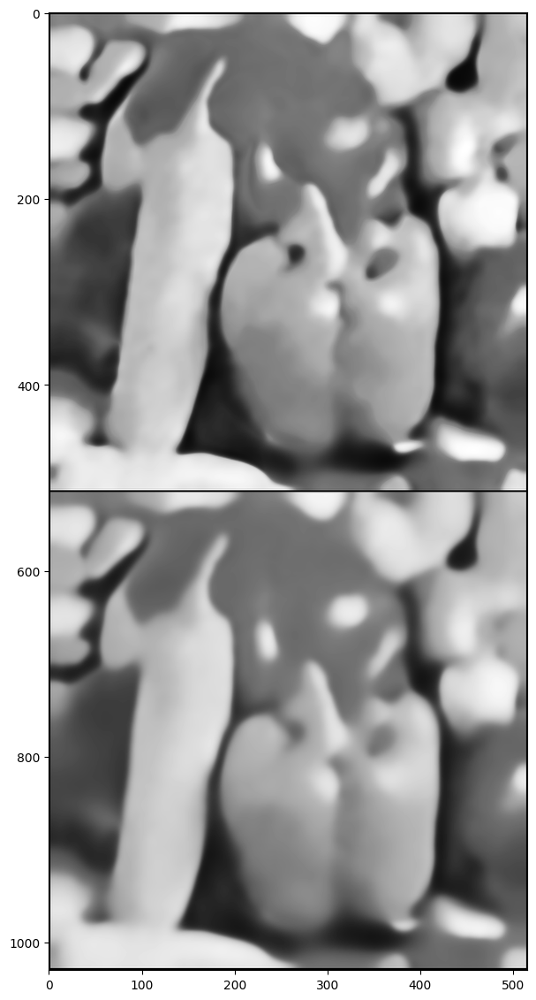

...

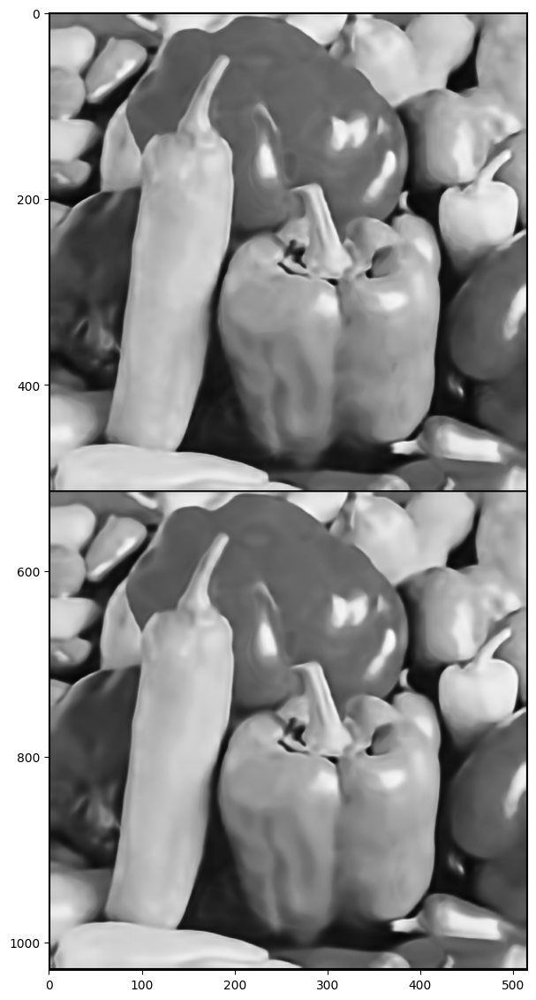

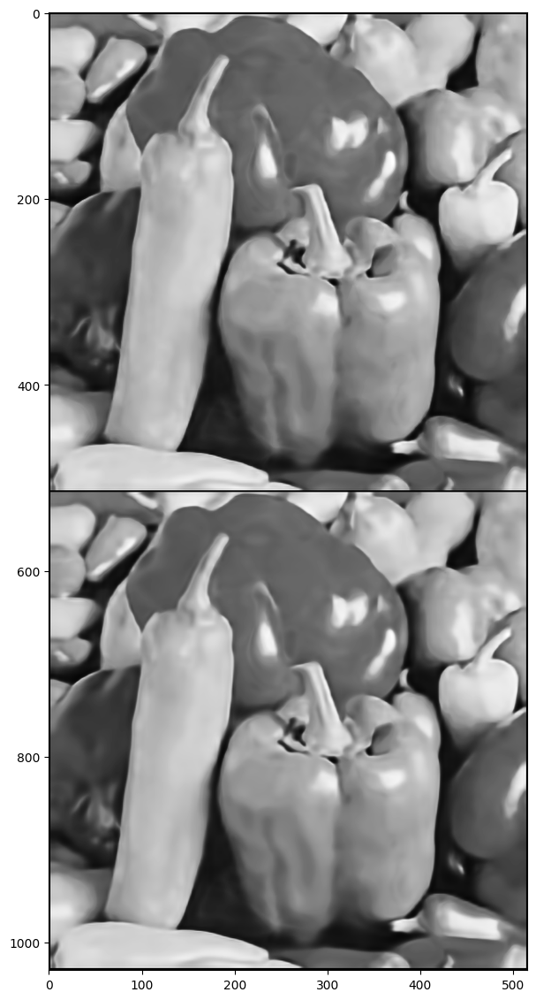

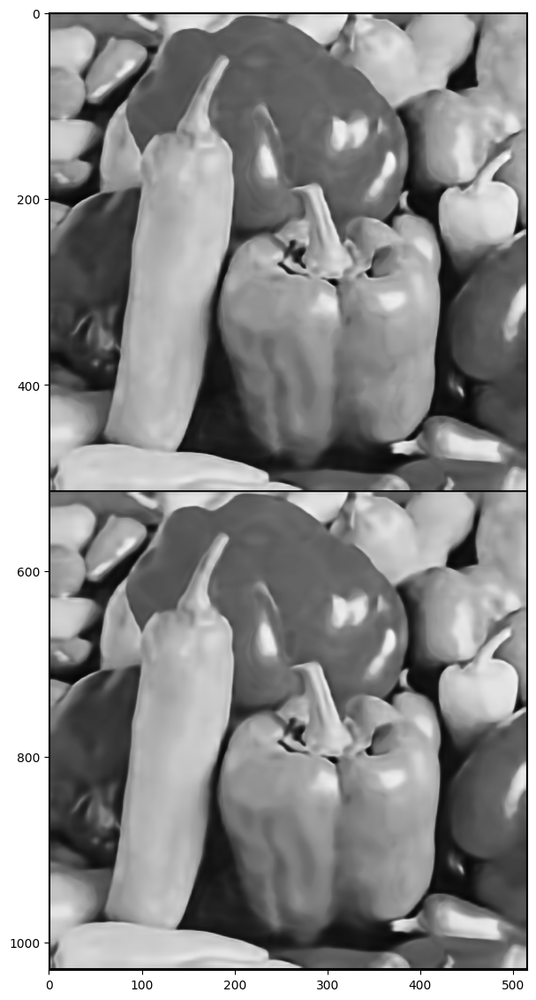

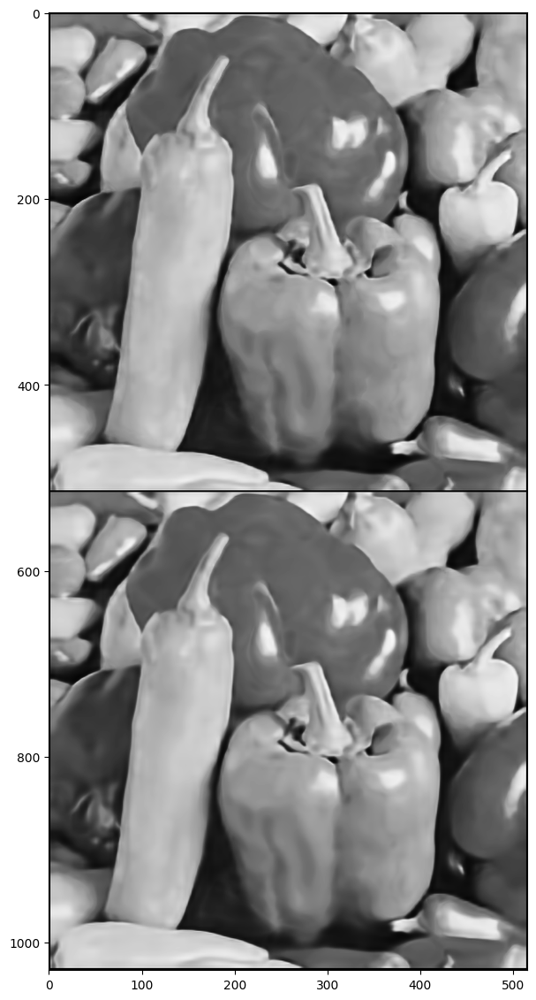

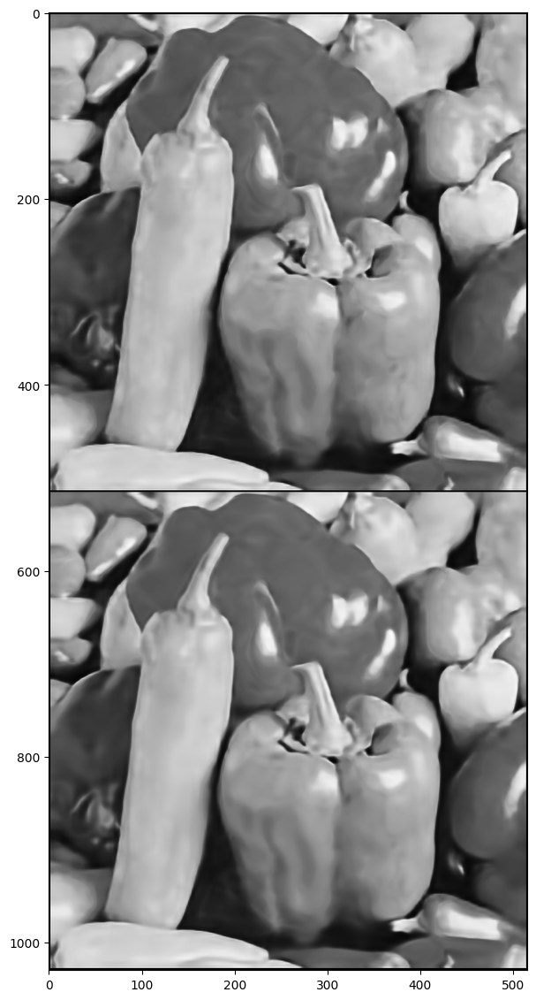

In [14]:
net_input_saved = net_input.detach().clone()
noise = net_input.detach().clone()
out_avg = None
last_net = None
psrn_noisy_last = 0

i = 0
def closure():

    global i, out_avg, psrn_noisy_last, last_net, net_input

    if reg_noise_std > 0:
        net_input = net_input_saved + (noise.normal_() * reg_noise_std)

    out = net(net_input)

    # Smoothing
    if out_avg is None:
        out_avg = out.detach()
    else:
        out_avg = out_avg * exp_weight + out.detach() * (1 - exp_weight)

    total_loss = mse(out, img_noisy_torch)
    total_loss.backward()


    psrn_noisy = peak_signal_noise_ratio(img_noisy_np, out.detach().cpu().numpy()[0])
    psrn_gt    = peak_signal_noise_ratio(img_np, out.detach().cpu().numpy()[0])
    psrn_gt_sm = peak_signal_noise_ratio(img_np, out_avg.detach().cpu().numpy()[0])

    # Note that we do not have GT for the "snail" example
    # So 'PSRN_gt', 'PSNR_gt_sm' make no sense
    print ('Iteration %05d    Loss %f   PSNR_noisy: %f   PSRN_gt: %f PSNR_gt_sm: %f' % (i, total_loss.item(), psrn_noisy, psrn_gt, psrn_gt_sm), '\r', end='')
    if  PLOT and i % show_every == 0:
        out_np = torch_to_np(out)
        plot_image_grid([np.clip(out_np, 0, 1),
                         np.clip(torch_to_np(out_avg), 0, 1)], factor=figsize, nrow=1)



    # Backtracking
    if i % show_every:
        if psrn_noisy - psrn_noisy_last < -5:
            print('Falling back to previous checkpoint.')

            for new_param, net_param in zip(last_net, net.parameters()):
                net_param.data.copy_(new_param.cuda())

            return total_loss*0
        else:
            last_net = [x.detach().cpu() for x in net.parameters()]
            psrn_noisy_last = psrn_noisy

    i += 1

    return total_loss

p = get_params(OPT_OVER, net, net_input)
optimize(OPTIMIZER, p, closure, LR, num_iter)

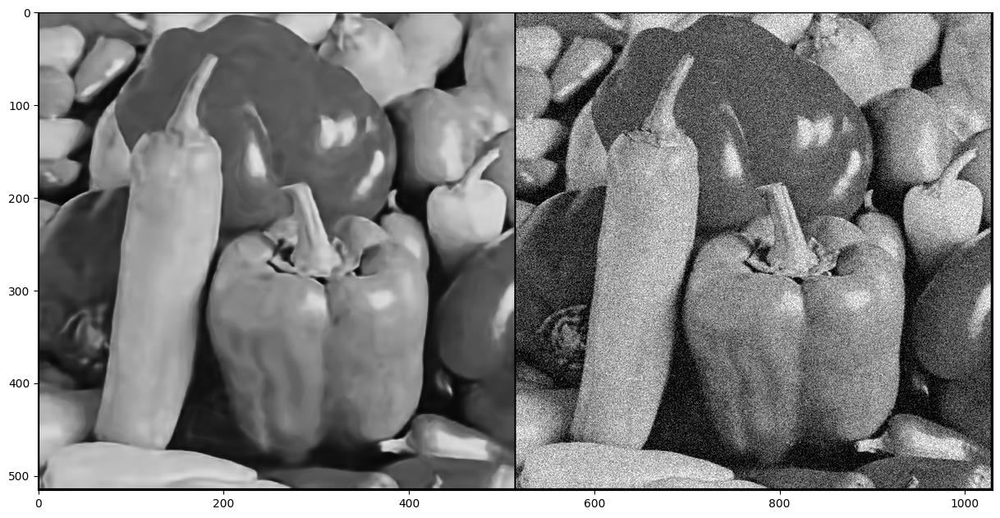

In [15]:
out_np = torch_to_np(net(net_input))
q = plot_image_grid([np.clip(out_np, 0, 1), img_noisy_np], factor=13);